In [3]:
#Dependências
#pip install mitdeeplearning
#apt-get install abcmidi
#apt-get install timidity
import mitdeeplearning.lab1 as mit
import os
from IPython import display as ipythondisplay
import numpy as np
from tensorflow import keras
import tensorflow as tf 
from keras.models import Sequential
from keras.layers import Dense, LSTM
import matplotlib.pyplot as plt
import regex as re
from music21 import converter
from scipy.io import wavfile
from IPython.display import Audio

2023-07-20 13:39:02.449792: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-07-20 13:39:03.314293: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-07-20 13:39:03.319075: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-20 13:39:09.144291: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


# carregando dataset

In [4]:
songs = mit.load_training_data()

Found 817 songs in text


In [5]:
songs[0]

"X:1\nT:Alexander's\nZ: id:dc-hornpipe-1\nM:C|\nL:1/8\nK:D Major\n(3ABc|dAFA DFAd|fdcd FAdf|gfge fefd|(3efe (3dcB A2 (3ABc|!\ndAFA DFAd|fdcd FAdf|gfge fefd|(3efe dc d2:|!\nAG|FAdA FAdA|GBdB GBdB|Acec Acec|dfaf gecA|!\nFAdA FAdA|GBdB GBdB|Aceg fefd|(3efe dc d2:|!"

In [6]:
mit.save_song_to_abc(songs[0])
cmd = "abc2midi {} -o {}".format(os.path.abspath('tmp.abc'), os.path.abspath('tmp.mid'))
os.system(cmd)
cmd = "timidity {}.mid -Ow {}.wav".format('tmp', 'output')
ret = os.system(cmd)


4.68 February 18 2022 abc2midi
Failed to open file /home/bryannvictorr/Desktop/Sistemas
Playing tmp.mid
MIDI file: tmp.mid
Format: 1  Tracks: 2  Divisions: 1024
Track name: 
Output tmp.wav
Playing time: ~15 seconds
Notes cut: 0
Notes lost totally: 0
Playing output.wav
MIDI file: output.wav
output.wav: No such file or directory


In [8]:
ipythondisplay.Audio('tmp.wav',rate=22050, autoplay=True)

# criando o vocabulario e dicionario

In [5]:
songs_joined = "\n\n".join(songs) 
def build_vocab(songs):
    vocab = sorted(set(songs_joined))
    return vocab

In [7]:
print(len(songs_joined))

200679


In [6]:
vocab = build_vocab(songs)

In [9]:
print(len(vocab))

83


In [7]:
def build_dictionary(vocab):
    idx2char = []
    for c in vocab :
        if c not in idx2char : idx2char.append(c)
    char2idx = {w: i for i, w in enumerate(idx2char)} 
    return idx2char, char2idx

In [8]:
idx2char, char2idx = build_dictionary(vocab)

In [9]:
def vectorize_string (songs_joined):
      vectorized = [char2idx[c] for c in songs_joined] 
      vectorized = np.array(vectorized, dtype= 'i')     
      return vectorized

In [10]:
vectorized_songs = vectorize_string(songs_joined)

In [14]:
print(len(vectorized_songs))

200679


In [15]:
print(repr(songs_joined[:15]), vectorized_songs[:15])

'X:1\nT:Alexander' [49 22 13  0 45 22 26 67 60 79 56 69 59 60 73]


In [11]:
idx2char[26]

'A'

# divisao treino/validação

In [12]:
## texto Hello e tamanho da sequência = 4: in:Hell e out:ello
def get_batch(vectorized_songs, seq_length, batch_size):
    
    # captura o tamanho do dataset vetorizado: 200679
    n = vectorized_songs.shape[0] - 1

    # escolhe aleatoriamente os índices iniciais da sentenças
    idx = np.random.choice(n-seq_length, batch_size)

    input_batch = [[vectorized_songs[i:i+seq_length] for i in idx]]
    output_batch = [[vectorized_songs[i+1: i+1+seq_length] for i in idx]]

    x_batch = np.reshape(input_batch, [batch_size, seq_length])
    y_batch = np.reshape(output_batch, [batch_size, seq_length])
        
    return x_batch, y_batch

In [13]:
batch_size = 4000  
seq_length = 50  

x_batch, y_batch = get_batch(vectorized_songs, seq_length=seq_length, batch_size=batch_size)
x_train, y_train = x_batch[:3600], y_batch[:3600]
x_valid, y_valid = x_batch[3600:-1], y_batch[3600:-1]

In [19]:
print(x_train.shape,y_train.shape,x_valid.shape,y_valid.shape)

(3600, 50) (3600, 50) (399, 50) (399, 50)


# treinando a rnn

In [14]:
def create_model(vocab_size, embedding_dim, rnn_units):
    # definindo a arquitetura do modelo    
    model = keras.models.Sequential([
        keras.layers.Embedding(vocab_size, embedding_dim), 
        keras.layers.LSTM(rnn_units, recurrent_initializer='glorot_uniform', recurrent_activation='sigmoid', return_sequences=True),
        keras.layers.Dense(units=vocab_size,activation='softmax')
    ])

    return model

In [15]:
def train_model(model, x_train, y_train, x_valid, y_valid):
        
    # Compilando e treinando o modelo
    model.compile(loss=tf.keras.losses.sparse_categorical_crossentropy,
              optimizer=tf.keras.optimizers.Adam(learning_rate=5e-3),
    )
    
    checkpoint_filepath = './lstm_best_model'
    model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
        filepath=checkpoint_filepath,
        save_weights_only=True,
        monitor='val_loss',
        mode='min',
        save_best_only=True)
    
    history = model.fit(x_train, y_train, epochs=20, validation_data=(x_valid, y_valid), callbacks=[model_checkpoint_callback])
    
    return model, history

Epoch 1/20
113/113 [==============================] - 81s 703ms/step - loss: 2.5944 - val_loss: 1.5826
Epoch 2/20
113/113 [==============================] - 82s 725ms/step - loss: 1.4305 - val_loss: 1.3207
Epoch 3/20
113/113 [==============================] - 79s 702ms/step - loss: 1.2411 - val_loss: 1.2137
Epoch 4/20
113/113 [==============================] - 79s 695ms/step - loss: 1.1151 - val_loss: 1.1174
Epoch 5/20
113/113 [==============================] - 82s 725ms/step - loss: 1.0102 - val_loss: 1.0656
Epoch 6/20
113/113 [==============================] - 82s 729ms/step - loss: 0.9213 - val_loss: 1.0267
Epoch 7/20
113/113 [==============================] - 82s 724ms/step - loss: 0.8334 - val_loss: 0.9896
Epoch 8/20
113/113 [==============================] - 82s 723ms/step - loss: 0.7492 - val_loss: 0.9667
Epoch 9/20
113/113 [==============================] - 82s 722ms/step - loss: 0.6753 - val_loss: 0.9509
Epoch 10/20
113/113 [==============================] - 82s 724ms/step - l

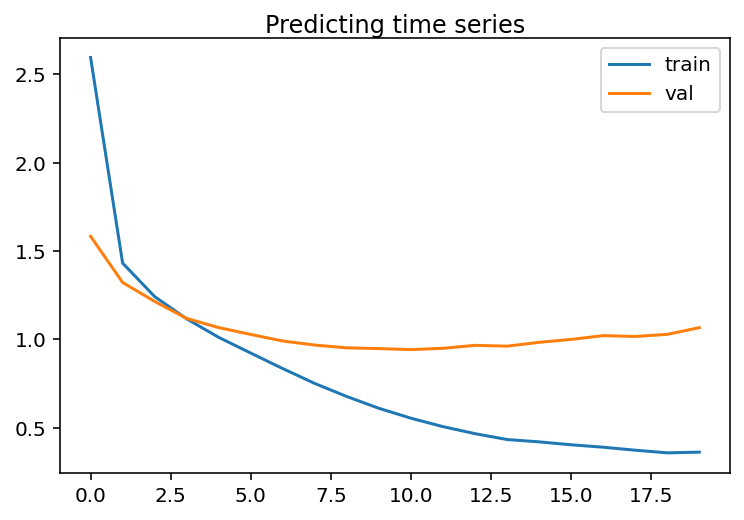

In [22]:
vocab_size = len(vocab)
embedding_dim = 256 
rnn_units = 1024 

model = create_model(vocab_size, embedding_dim, rnn_units)
model, history = train_model(model, x_train,y_train,x_valid,y_valid)

# plotando as curvas de aprendizado
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='val')
plt.title('Predicting time series', pad=-80)
plt.legend()
plt.show()

# Predizendo a música

In [23]:
model = create_model(vocab_size, embedding_dim, rnn_units)
model.load_weights('lstm_best_model')

In [16]:
start_string = "X:1\nT:Alexander's\nZ: id:dc-hornpipe-1\nM:C|\nL:1/8\nK:D Major\n"
def generate_text(model, start_string, generation_length=170):
    input_eval = [char2idx[s] for s in start_string]
    input_eval = tf.expand_dims(input_eval, 0)
    text_generated = []

    for i in range(generation_length):
        predictions = model(input_eval)
        sampled_indices = tf.random.categorical(predictions[0], num_samples=1)[-1,0].numpy()
        
        #Passa a previsão junto com o estado anterior como as próximas entradas do modelo
        input_eval = tf.expand_dims([sampled_indices], 0)
        text_generated.append(idx2char[sampled_indices])
        
    return (start_string + ''.join(text_generated))

#def generate_text(model, start_string, header, generation_length=170):
#    input_eval = [char2idx[s] for s in start_string]
#    input_eval = tf.expand_dims(input_eval, 0)
#    text_generated = []
#
#    for i in range(generation_length):
#        predictions = model(input_eval)
#        sampled_indices = tf.random.categorical(predictions[0], num_samples=1)[-1,0].numpy()
#
#        # Passa a previsão junto com o estado anterior como as próximas entradas do modelo
#        input_eval = tf.expand_dims([sampled_indices], 0)
#        text_generated.append(idx2char[sampled_indices])
#
#    generated_text = start_string + header + ''.join(text_generated)
#    return generated_text


In [17]:
generated_text = generate_text(model, start_string=start_string, generation_length=170)

NameError: name 'model' is not defined

In [26]:
print(generated_text)

X:1
T:Alexander's
Z: id:dc-hornpipe-1
M:C|
L:1/8
K:D Major
FZUQ^QB/L-x](Y5j8)znvaYdFvRlMYRBqjFl,4]v
U21)fXxf6h/i_
OPy2[/8hy87!Bh10Eyv/(
./5LulZH)BXpoe2q[>rw2A0N7d(H3x56j7=Ib1YgcnOa.# n.fFZD>t'DDbD(k"]=C
X>aY46/I>0
 ^ [9]W:3K|#gSj


In [27]:
mit.save_song_to_abc(generated_text)

'tmp'

In [28]:
cmd = "abc2midi {} -o {}".format('tmp3.abc', "tmp3.mid")
os.system(cmd)
cmd = "timidity {}.mid -Ow {}.wav".format('tmp3', 'tmp3')
ret = os.system(cmd)

In [ ]:
ipythondisplay.Audio('tmp3.wav',rate=22050, autoplay=True)

# Atividade
Atividade(0−10):  Treine uma RNN para para prever uma música:

1 Criar uma etapa de pré-processamento onde os cabeçalhos dos arquivos .abc serão desprezados e a rede será treinada apenas com a melodia da música;
2 Variar os parâmetros e arquitetura da rede e comparar as acurárias de treinamento e validação:
Aumentar as amostras de treinamento;
Variar o tamanho da sequência: [25 -150]
Variar as épocas de treinamento
Variar o número de neurônios da camada LSTM: [1024-2048]
Aumentar o número de camadas LSTM.
Add camada de dropout
3 Extrapolar o modelo gerado para um novo dataset e apresentar a música estimada para os novos dados: http://abc.sourceforge.net/NMD/

# 1 Q

In [18]:
def remover_header(song):
  try:
    return '\n'.join(song.split('K:')[1].split('\n')[1:])
  except:
    return song

In [19]:
songs_without_header = [remover_header(song) for song in songs]
songs_without_header[0]

'(3ABc|dAFA DFAd|fdcd FAdf|gfge fefd|(3efe (3dcB A2 (3ABc|!\ndAFA DFAd|fdcd FAdf|gfge fefd|(3efe dc d2:|!\nAG|FAdA FAdA|GBdB GBdB|Acec Acec|dfaf gecA|!\nFAdA FAdA|GBdB GBdB|Aceg fefd|(3efe dc d2:|!'

In [20]:
songs_without_header_joined = '\n\n'.join(songs_without_header)

In [21]:
vocab = build_vocab(songs_without_header)

In [22]:
idx2char, char2idx = build_dictionary(vocab)

In [23]:
vectorized_songs = vectorize_string(songs_without_header_joined)

In [24]:
batch_size = 4000  
seq_length = 50  

x_batch, y_batch = get_batch(vectorized_songs, seq_length=seq_length, batch_size=batch_size)
x_train, y_train = x_batch[:3600], y_batch[:3600]
x_valid, y_valid = x_batch[3600:-1], y_batch[3600:-1]

Epoch 1/20
113/113 [==============================] - 242s 2s/step - loss: 2.3169 - val_loss: 1.6143
Epoch 2/20
113/113 [==============================] - 226s 2s/step - loss: 1.4988 - val_loss: 1.3728
Epoch 3/20
113/113 [==============================] - 162s 1s/step - loss: 1.3002 - val_loss: 1.2332
Epoch 4/20
113/113 [==============================] - 135s 1s/step - loss: 1.1580 - val_loss: 1.1332
Epoch 5/20
113/113 [==============================] - 132s 1s/step - loss: 1.0343 - val_loss: 1.0785
Epoch 6/20
113/113 [==============================] - 134s 1s/step - loss: 0.9220 - val_loss: 1.0268
Epoch 7/20
113/113 [==============================] - 130s 1s/step - loss: 0.8174 - val_loss: 0.9759
Epoch 8/20
113/113 [==============================] - 127s 1s/step - loss: 0.7127 - val_loss: 0.9340
Epoch 9/20
113/113 [==============================] - 132s 1s/step - loss: 0.6250 - val_loss: 0.9059
Epoch 10/20
113/113 [==============================] - 143s 1s/step - loss: 0.5468 - val_lo

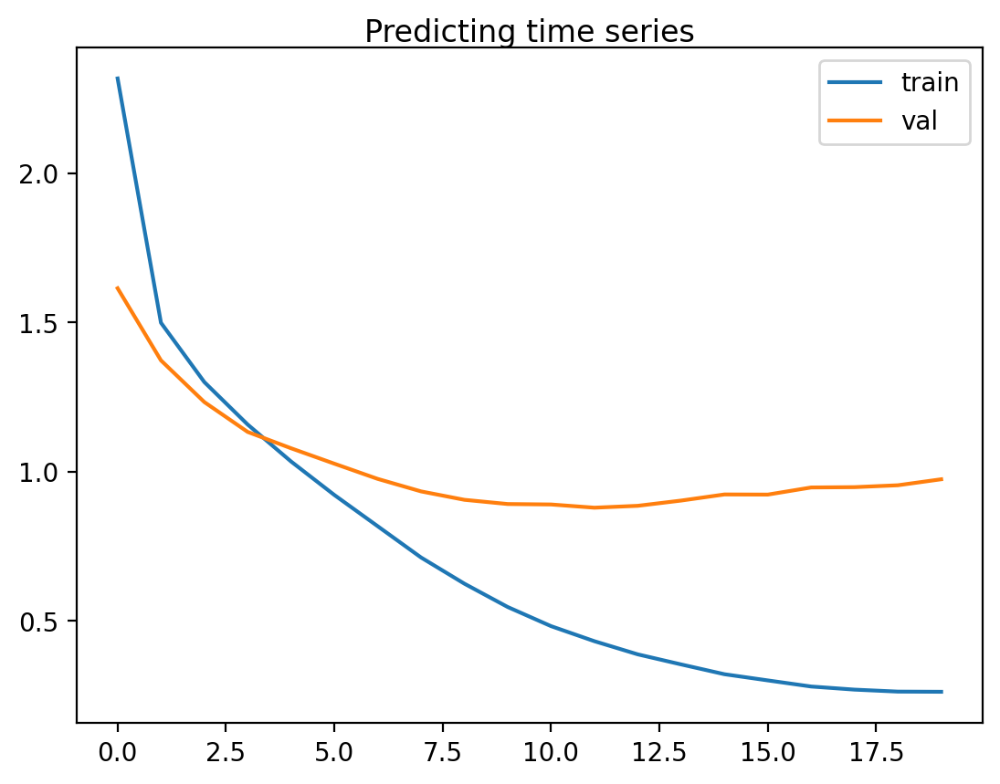

In [25]:
vocab_size = len(vocab)
embedding_dim = 256 
rnn_units = 1024 

model = create_model(vocab_size, embedding_dim, rnn_units)
model, history = train_model(model, x_train, y_train, x_valid, y_valid)

# plotando as curvas de aprendizado
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='val')
plt.title('Predicting time series', pad=-80)
plt.legend()
plt.show()

In [26]:
model = create_model(vocab_size, embedding_dim, rnn_units)
model.load_weights('lstm_best_model')

In [27]:
generated_text = generate_text(model, start_string=start_string, generation_length=170)

In [28]:
print(generated_text)

X:1
T:Alexander's
Z: id:dc-hornpipe-1
M:C|
L:1/8
K:D Major
5Ar-ju!<x1I"iCkPGFzcT]sQ8)Kye:In!RX]r'UFBeW. ^bB/ia41RqGteYAU9-:wvICY:,ww==M/6r!nEE[YjBB",lqq!)iRE2THEc2jcr3s2X=H=cA)zrC<ycoYe6D7Eos7ZDiXMz8WuZd,yh'mzQQ#
S<Iu8Jhb|Q81_"JX


In [29]:
mit.save_song_to_abc(generated_text)

'tmp'

In [30]:
cmd = "abc2midi {} -o {}".format('tmp.abc', "tmp.mid")
os.system(cmd)
cmd = "timidity {}.mid -Ow {}.wav".format('tmp', 'tmp')
ret = os.system(cmd)

4.68 February 18 2022 abc2midi
Error in line-char 7-0 : Unrecognized character: 5
Warning in line-char 7-2 : Ignoring reserved character r
Warning in line-char 7-4 : Ignoring reserved character j
Error in line-char 7-5 : Malformed note : expecting a-g or A-G
Warning in line-char 7-6 : instruction !<x1I"iCkPGFzcT]sQ8)Kye:In! ignored
Error in line-char 7-33 : Malformed note : expecting a-g or A-G
Error in line-char 7-35 : Chord already finished
Warning in line-char 7-36 : Ignoring reserved character r
Error in line-char 7-37 : Malformed note : expecting a-g or A-G
Warning in line-char 7-38 : Ignoring reserved character U
Warning in line-char 7-42 : Ignoring reserved character W
Error in line-char 7-43 : Malformed note : expecting a-g or A-G
Warning in line-char 7-49 : Ignoring reserved character i
Error in line-char 7-53 : Malformed note : expecting a-g or A-G
Warning in line-char 7-54 : Ignoring reserved character q
Warning in line-char 7-56 : Ignoring reserved character t
Warning in li

In [31]:
ipythondisplay.Audio('tmp.wav', rate=22050, autoplay=True)

# 2 Q

In [32]:
from keras import layers
def create_model2(vocab_size, embedding_dim, rnn_units):
    # definindo a arquitetura do modelo    
    model = keras.models.Sequential([
        keras.layers.Embedding(vocab_size, embedding_dim), 
        keras.layers.LSTM(rnn_units, recurrent_initializer='glorot_uniform', recurrent_activation='sigmoid', return_sequences=True),
        keras.layers.LSTM(rnn_units, recurrent_initializer='glorot_uniform', recurrent_activation='sigmoid', return_sequences=True),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(units=vocab_size,activation='softmax')
    ])

    return model

In [33]:
def train_model2(model, x_train, y_train, x_valid, y_valid):
        
    # Compilando e treinando o modelo
    model.compile(loss=tf.keras.losses.sparse_categorical_crossentropy,
              optimizer=tf.keras.optimizers.Adam(learning_rate=5e-3),
    )
    
    checkpoint_filepath = './lstm_best_model'
    model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
        filepath=checkpoint_filepath,
        save_weights_only=True,
        monitor='val_loss',
        mode='min',
        save_best_only=True)
    
    history = model.fit(x_train, y_train, epochs=30, validation_data=(x_valid, y_valid), callbacks=[model_checkpoint_callback])
    
    return model, history

In [34]:
batch_size = 6000
seq_length = 60

x_batch, y_batch = get_batch(vectorized_songs, seq_length=seq_length, batch_size=batch_size)
x_train, y_train = x_batch[:5500], y_batch[:5500]
x_valid, y_valid = x_batch[5500:-1], y_batch[5500:-1]
printlen(vocab)

Epoch 1/30
172/172 [==============================] - 341s 2s/step - loss: 3.0349 - val_loss: 2.9275
Epoch 2/30
172/172 [==============================] - 334s 2s/step - loss: 2.9009 - val_loss: 2.6826
Epoch 3/30
172/172 [==============================] - 328s 2s/step - loss: 2.3710 - val_loss: 1.9591
Epoch 4/30
172/172 [==============================] - 321s 2s/step - loss: 1.8468 - val_loss: 1.5735
Epoch 5/30
172/172 [==============================] - 320s 2s/step - loss: 1.5348 - val_loss: 1.4166
Epoch 6/30
172/172 [==============================] - 320s 2s/step - loss: 1.3988 - val_loss: 1.2927
Epoch 7/30
172/172 [==============================] - 321s 2s/step - loss: 1.2956 - val_loss: 1.2132
Epoch 8/30
172/172 [==============================] - 322s 2s/step - loss: 1.2142 - val_loss: 1.1482
Epoch 9/30
172/172 [==============================] - 328s 2s/step - loss: 1.1406 - val_loss: 1.0987
Epoch 10/30
172/172 [==============================] - 324s 2s/step - loss: 1.0732 - val_lo

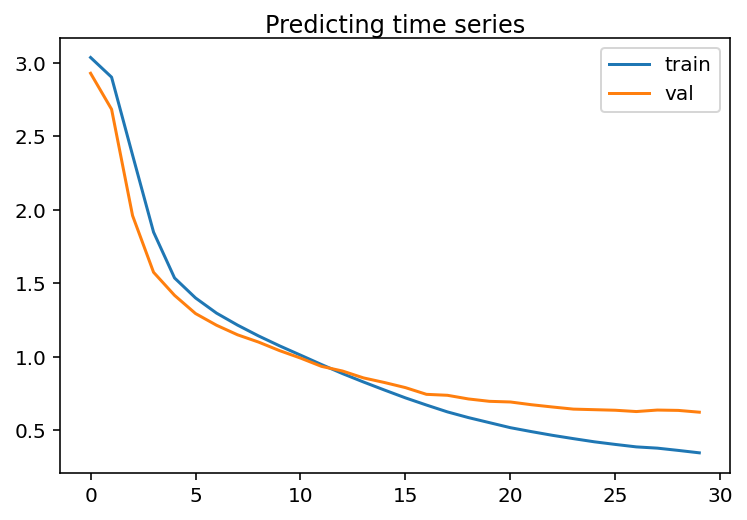

In [68]:
vocab_size = len(vocab)
embedding_dim = 256
rnn_units = 1024

model = create_model2(vocab_size, embedding_dim, rnn_units)
model, history = train_model2(model, x_train, y_train, x_valid, y_valid)

# plotando as curvas de aprendizado
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='val')
plt.title('Predicting time series', pad=-80)
plt.legend()
plt.show()

In [69]:
model = create_model(vocab_size, embedding_dim, rnn_units)
model.load_weights('lstm_best_model')

In [70]:
generated_text = generate_text(model, start_string=start_string, generation_length=170)

In [71]:
print(generated_text)

X:1
T:Alexander's
Z: id:dc-hornpipe-1
M:C|
L:1/8
K:D Major
Q-=8HzB|3Ci)#B!_)7XHm8FbWs
5
gX7I1kGk>u-UFwl9VR3 DORVTUGJt'd _KX_IT
iAg,"QO
IBwPQ_BrZliJF.NB:WTTFN]fOp1"=^)ht2Ej5zwqhq  :SV(ntCLC^nIYd>eA7lr5B-dGi,Ke5VkHYO)M=0P-nvlocz"hV


In [72]:
mit.save_song_to_abc(generated_text)

'tmp'

In [35]:
cmd = "abc2midi {} -o {}".format('tmp4.abc', "tmp4.mid")
os.system(cmd)
cmd = "timidity {}.mid -Ow {}.wav".format('tmp4', 'tmp4')
ret = os.system(cmd)

4.68 February 18 2022 abc2midi
Failed to open file tmp4.abc
Playing tmp4.mid
MIDI file: tmp4.mid
tmp4.mid: No such file or directory
Playing tmp4.wav
MIDI file: tmp4.wav
tmp4.wav: No such file or directory


In [ ]:
ipythondisplay.Audio('tmp.wav', rate=22050, autoplay=True)

# Q 3

In [38]:
with open('jigs.txt', 'r') as f:
  file_lines = f.read()

new_songs = [x for x in file_lines.split('\n\n') if x]
len(new_songs)

340

In [39]:
print(new_songs[1])

X: 2
T:Abacus
% Nottingham Music Database
S:By Hugh Barwell, via Phil Rowe
M:6/8
K:G
"G"g2g B^AB|d2d G3|"Em"GAB "Am"A2A|"D7"ABc "G"BAG|
"G"g2g B^AB|d2d G2G|"Em"GAB "Am"A2G|"D7"FGA "G"G3::
"D7"A^GA DFA|"G"B^AB G3|"A7"^c=c^c Ace|"D7"fef def|
"G"g2g de=f|"E7"e2e Bcd|"Am"c2c "D7"Adc| [1"G"B2A G3:|
 [2"G"B2A G2F||"Em"E2E G2G|B2B e2e|"Am"c2A "B7"FBA|"Em"G2F E3|"Em"EFG "Am"ABc|
"B7"B^c^d "Em"e2e|"F#7"f2f f2e|"B7"^def BAF|"Em"E2E G2G|B2B e2e|
"Am"c2A "B7"FBA|"Em"G2F E3|"Em"EFG "Am"ABc|"B7"B^c^d "Em"e2e|
"F#7"f2e "B7"^def |[1"Em"e3 "D7"d3:|[2"Em"e3 "E7"e3||


In [40]:
print(new_songs[3])


X: 4
T:Ap Shenkin
% Nottingham Music Database
P:AABABA
S:FTB 1 p 46, via EF
M:4/4
K:G
M:6/8
|d/2c/2\
P:A
!segno! "G"B2B Bgf|"C"e2e efg|"G"ded "Em"dcB|"Am"cAA "D7"Adc|
"G"BcB Bgf|"C"efe efg|"G"ded "D7"cBA|"G"G2B G3|
P:B
|g/2a/2|"G"b2g "D"a2f|"G"gfg "G"dcB|"C"cde "G"dgB|"Am"BAA "D7"A2g/2a/2|
"G"b2g "D"a2f|"Em"gfe "D7"agf|"G"bag "A7"fge|"D7"dgf ed\
P:D.S.
c|


In [41]:
print(new_songs[3].split('P:B')[0])


X: 4
T:Ap Shenkin
% Nottingham Music Database
P:AABABA
S:FTB 1 p 46, via EF
M:4/4
K:G
M:6/8
|d/2c/2\
P:A
!segno! "G"B2B Bgf|"C"e2e efg|"G"ded "Em"dcB|"Am"cAA "D7"Adc|
"G"BcB Bgf|"C"efe efg|"G"ded "D7"cBA|"G"G2B G3|



In [42]:
mit.save_song_to_abc(new_songs[3].split('P:B')[0])
cmd = "abc2midi {} -o {}".format('tmp7.abc', "tmp7.mid")
os.system(cmd)
cmd = "timidity {}.mid -Ow {}.wav".format('tmp', 'tmp')
ret = os.system(cmd)

4.68 February 18 2022 abc2midi
Failed to open file tmp7.abc
Playing tmp.mid
MIDI file: tmp.mid
Format: 0  Tracks: 1  Divisions: 480
Text: note track
Sequence: Alexander's
Text: Z:id:dc-hornpipe-1
Output tmp.wav
Playing time: ~36 seconds
Notes cut: 0
Notes lost totally: 0
Playing tmp.wav
MIDI file: tmp.wav
tmp.wav: Not a MIDI file!


In [44]:
ipythondisplay.Audio('tmp.wav', rate=22050, autoplay=True)

In [45]:
songs_without_header = [remover_header(song) for song in new_songs]
print(songs_without_header[0])

M:6/8
P:A
f|"A"ecc c2f|"A"ecc c2f|"A"ecc c2f|"Bm"BcB "E7"B2f|
"A"ecc c2f|"A"ecc c2c/2d/2|"D"efe "E7"dcB| [1"A"Ace a2:|
 [2"A"Ace ag=g||\



In [46]:
songs_without_header_joined = '\n\n'.join(songs_without_header)
songs_joined = '\n\n'.join(new_songs)

In [47]:
vocab = build_vocab(songs_joined)

In [48]:
print(vocab)

['\n', ' ', '!', '"', '#', '%', '&', "'", '(', ')', '+', ',', '-', '.', '/', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', ':', '=', '>', '?', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', '[', '\\', ']', '^', '_', 'a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z', '|', '~']


In [49]:
idx2char, char2idx = build_dictionary(vocab)

In [50]:
vectorized_songs = vectorize_string(songs_without_header_joined)

In [51]:
batch_size = 6000  
seq_length = 60  

x_batch, y_batch = get_batch(vectorized_songs, seq_length=seq_length, batch_size=batch_size)
x_train, y_train = x_batch[:5500], y_batch[:5500]
x_valid, y_valid = x_batch[5500:-1], y_batch[5500:-1]

In [52]:
vocab_size = len(vocab)
embedding_dim = 256
rnn_units = 1024

model = create_model2(vocab_size, embedding_dim, rnn_units)
model, history = train_model2(model, x_train, y_train, x_valid, y_valid)

# plotando as curvas de aprendizado
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='val')
plt.title('Predicting time series', pad=-80)
plt.legend()
plt.show()

Epoch 1/30
  3/172 [..............................] - ETA: 9:49 - loss: 4.9990

KeyboardInterrupt: 

In [92]:
model = create_model(vocab_size, embedding_dim, rnn_units)
model.load_weights('lstm_best_model')

In [93]:
start_string = "X: 2\nT:Abacus\n% Nottingham Music Database\nS:By Hugh Barwell, via Phil Rowe\nM:6/8\nK:G"
generated_text = generate_text(model, start_string=start_string, generation_length=170)

In [94]:
print(generated_text)

X: 2
T:Abacus
% Nottingham Music Database
S:By Hugh Barwell, via Phil Rowe
M:6/8
K:GML
Y=sEveyt':gNwyhU3V(Q%(WO]HrXA
vwI?.?=nJzvo20r_q#5E"Qh3SlOmJ2T4j7D!WM:>_yvPSeqJFs'\RQ3S7m1r'jJzo,^HY"xp)ih:EsT/&"fwvq7Bp u!
o&rOE+(9w"FD.66)?\p!w>D:kbr!HwJ2x)-V\qir]r0e


In [95]:
mit.save_song_to_abc(generated_text)

'tmp'

In [97]:
#cmd = "abc2midi {} -o {}".format('tmp5.abc', "tmp5.mid")
#os.system(cmd)
#cmd = "timidity {}.mid -Ow {}.wav".format('tmp5', 'tmp5')
#ret = os.system(cmd)

# Converte o arquivo .abc para .midi
abc_file = 'tmp.abc'
midi_file = 'tmp.mid'
converter.parse(abc_file).write('midi', fp=midi_file)

# Converte o arquivo .midi para .wav
wav_file = 'tmp7.wav'
cmd = "timidity {} -Ow {}".format(midi_file, wav_file)
os.system(cmd)

abcFormat: WARNING: Could not get pitch information from note:  Y, assuming C
abcFormat: WARNING: Could not get pitch information from note:  =s, assuming C
abcFormat: WARNING: Could not get pitch information from note:  t', assuming C
abcFormat: WARNING: Could not get pitch information from note:  U3, assuming C
abcFormat: WARNING: Could not get pitch information from note:  =n, assuming C
abcFormat: WARNING: Could not get pitch information from note:  J, assuming C
abcFormat: WARNING: Could not get pitch information from note:  o20, assuming C
abcFormat: WARNING: Could not get pitch information from note:  _q, assuming C
abcFormat: WARNING: Could not get pitch information from note:  p, assuming C
abcFormat: WARNING: Could not get pitch information from note:  T/, assuming C
abcFormat: WARNING: Could not get pitch information from note:  p, assuming C
abcFormat: WARNING: Could not get pitch information from note:  J2, assuming C
abcFormat: WARNING: Could not get pitch information fro

1

In [99]:
ipythondisplay.Audio('tmp.wav', rate=22050, autoplay=True)

ValueError: could not convert string to float: 'tmp.wav'